In [ ]:
# В /whales_identify/train.py имеется функция по аугментации данных в процессе обучения модели.
# Такой вид аугментации - применение агументации для каждого изображения в процессе обучения с некоторыми вероятностями имеет
# множество преимуществ, поскольку позволяет не хранить все возможные варианты аугментации в памяти, а генерировать их на
# ходу.

# В данном ноутбуке пример работы

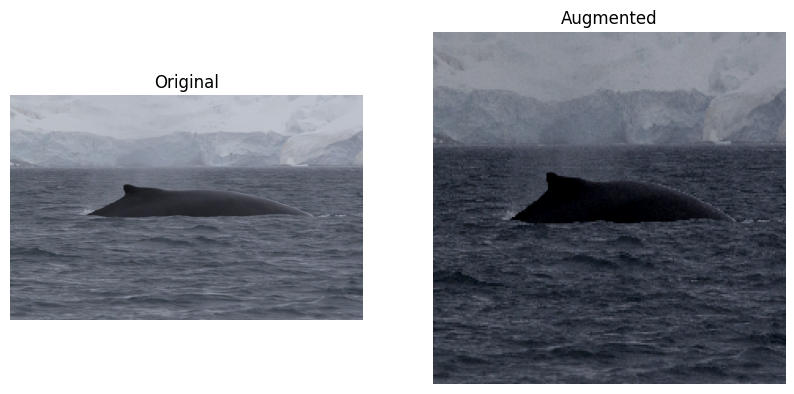

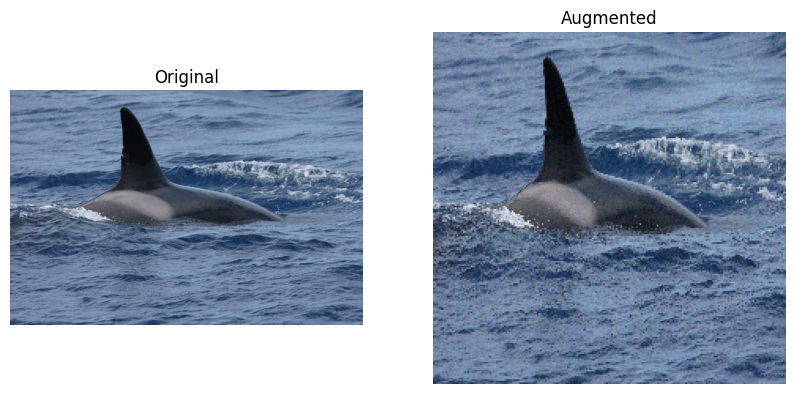

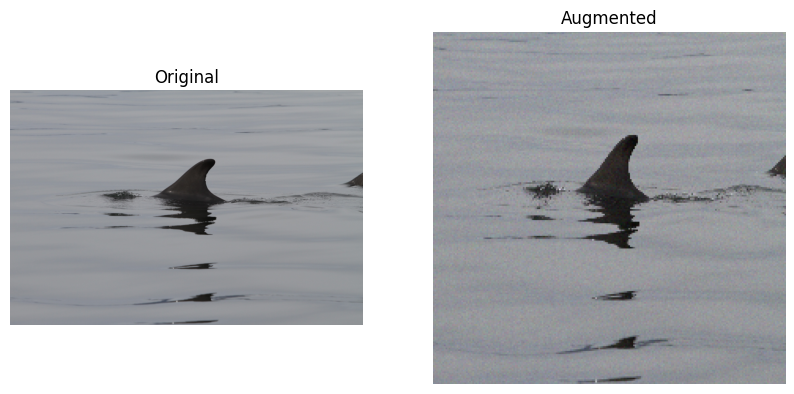

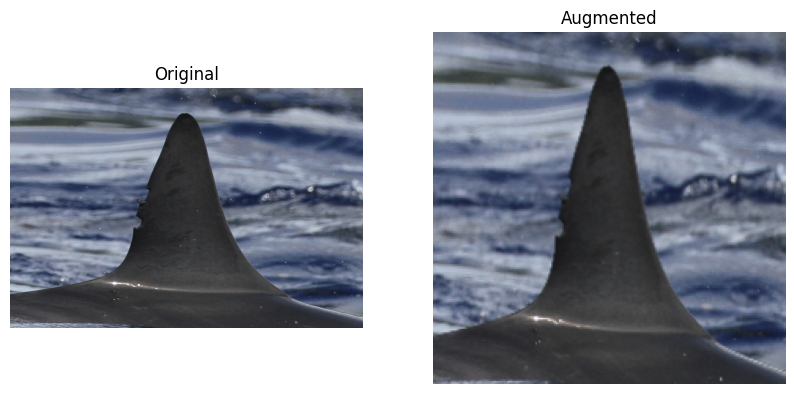

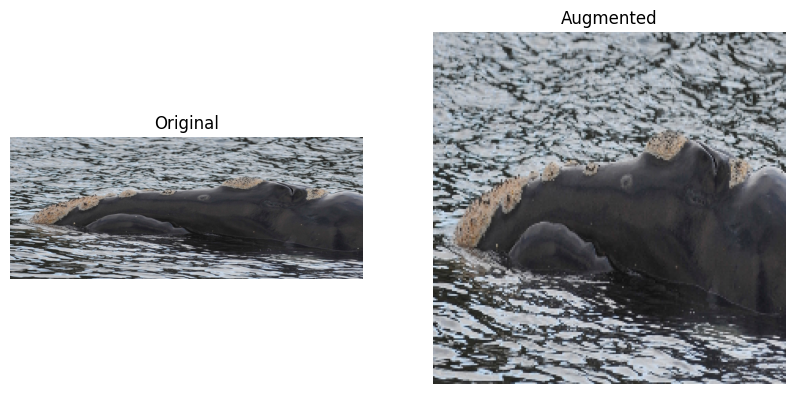

...

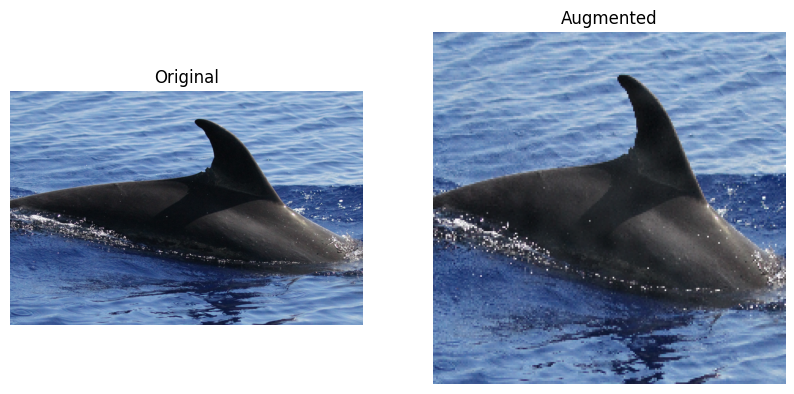

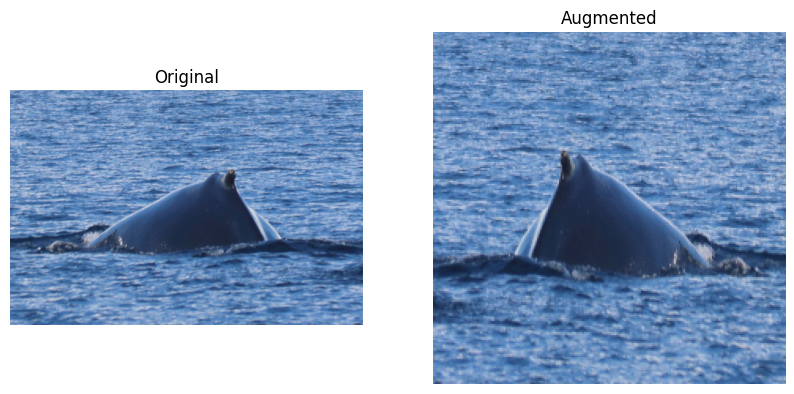

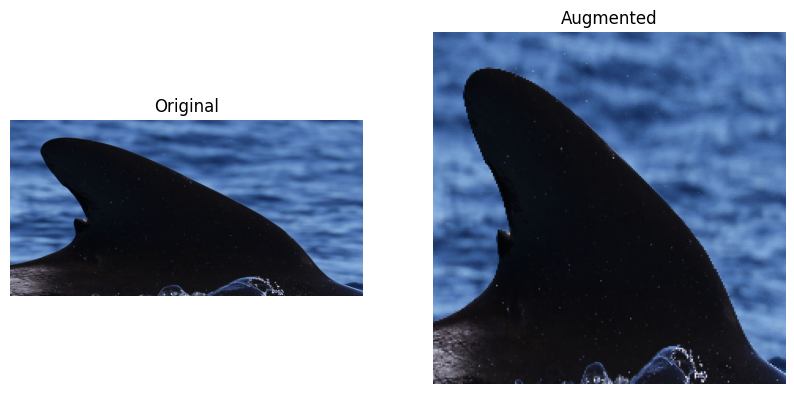

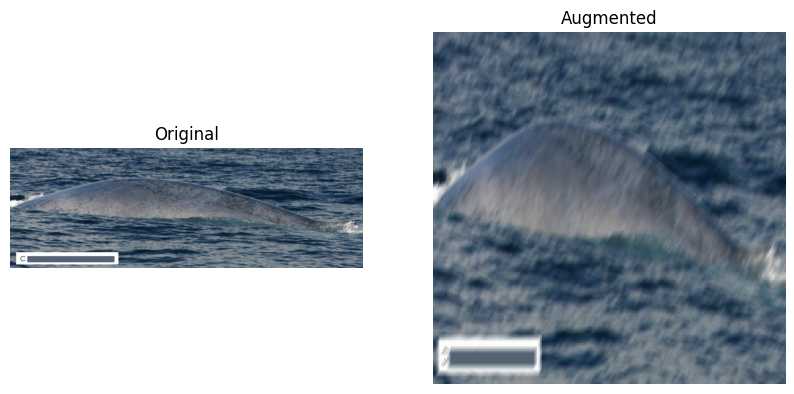

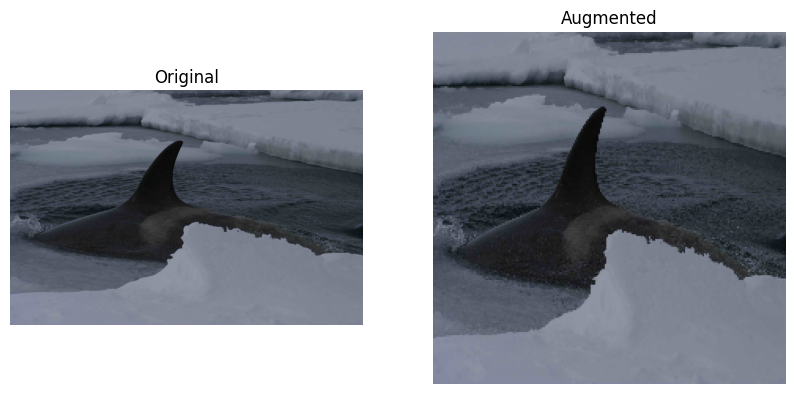

In [ ]:
import os
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np
import albumentations as A
from albumentations.pytorch import ToTensorV2
import cv2

# Конфигурация для аугментаций
CONFIG = {
    'img_size': 224  # Размер изображений после Resize
}

# Функция для определения аугментаций данных
def augmentation_data_transforms() -> dict:
    """
    Функция для определения аугментаций данных для обучения и валидации.

    Возвращает:
        dict: Словарь с аугментациями для тренировочных и валидационных данных.
    """
    data_transforms = {
        "train": A.Compose([
            A.Resize(CONFIG['img_size'], CONFIG['img_size']),
            A.OneOf([
                A.ShiftScaleRotate(shift_limit=0.15, scale_limit=0.2, rotate_limit=45, p=1.0),  # Сдвиги, масштабирование и повороты
                A.HorizontalFlip(p=1.0),  # Отражение
                A.RandomBrightnessContrast(brightness_limit=0.2, contrast_limit=0.2, p=1.0),  # Яркость и контрастность
                A.MotionBlur(blur_limit=5, p=1.0),  # Размытие в движении
                A.OpticalDistortion(distort_limit=0.1, shift_limit=0.1, p=1.0),  # Оптические искажения
                A.GaussNoise(var_limit=(10.0, 50.0), p=1.0),  # Шумы
                A.FancyPCA(alpha=0.1, p=1.0),  # Цветовые искажения
                A.RandomFog(fog_coef_lower=0.1, fog_coef_upper=0.3, alpha_coef=0.5, p=1.0),  # Имитация тумана
                A.RandomShadow(shadow_roi=(0, 0.5, 1, 1), num_shadows_lower=1, num_shadows_upper=2, shadow_dimension=5, p=1.0),  # Тени
            ], p=1.0)  # Выбираем одну из аугментаций
        ], p=1.0),


        "valid": A.Compose([
            A.Resize(CONFIG['img_size'], CONFIG['img_size']),
        ], p=1.0)
    }
    return data_transforms


# Директория с исходными изображениями
data_dir = "../../data/datasets"

# Применение аугментаций и отображение изображений
def process_images_with_augmentation(data_dir, transform):
    for file_name in os.listdir(data_dir):
        if file_name.lower().endswith(".jpg"):  # Проверяем, что файл - JPG
            file_path = os.path.join(data_dir, file_name)
            
            # Открываем изображение
            original = cv2.imread(file_path)
            original = cv2.cvtColor(original, cv2.COLOR_BGR2RGB)
            
            # Применяем аугментации
            augmented = transform(image=original)["image"]
            
            
            # Отображаем оригинальное и аугментированное изображение
            plt.figure(figsize=(10, 5))
            
            plt.subplot(1, 2, 1)
            plt.title("Original")
            plt.imshow(original)
            plt.axis("off")
            
            plt.subplot(1, 2, 2)
            plt.title("Augmented")
            plt.imshow(augmented)
            plt.axis("off")
            
            plt.show()

# Получаем аугментации
data_transforms = augmentation_data_transforms()

# Применяем аугментации к изображениям и показываем
process_images_with_augmentation(data_dir, data_transforms["train"])


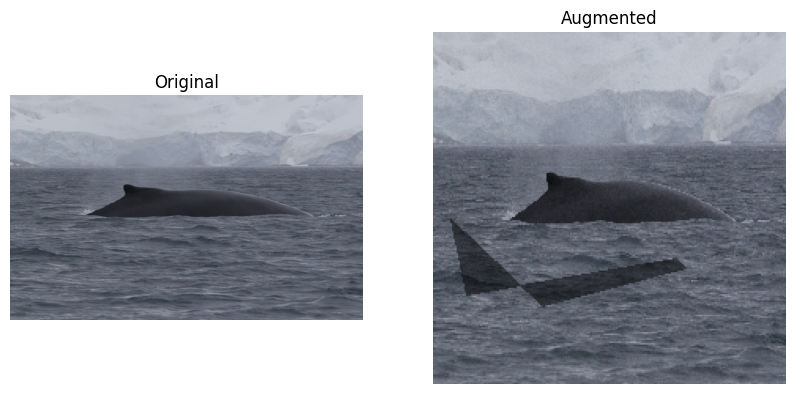

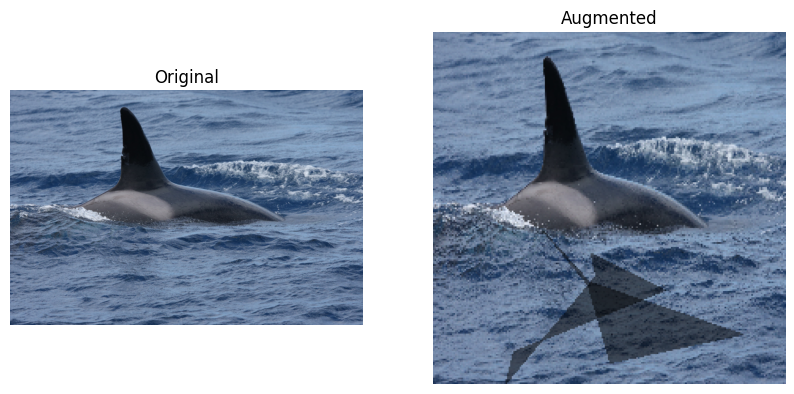

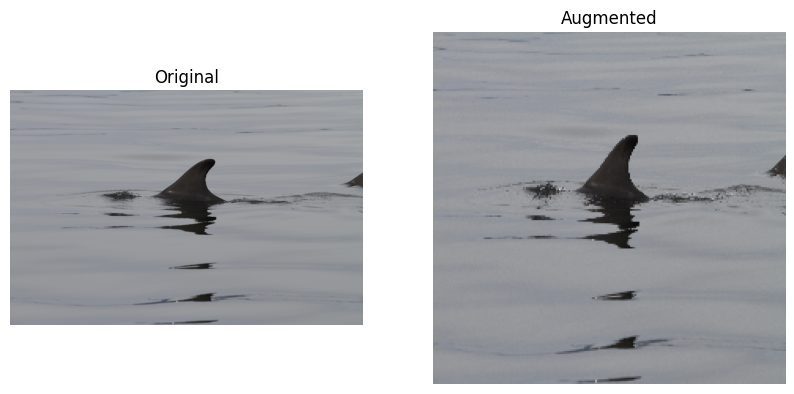

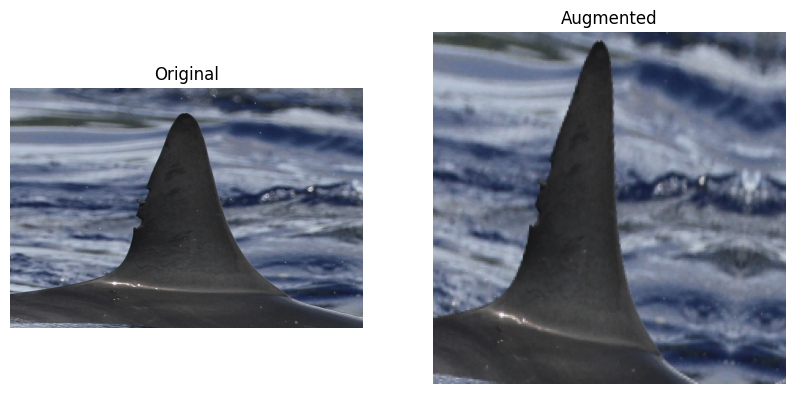

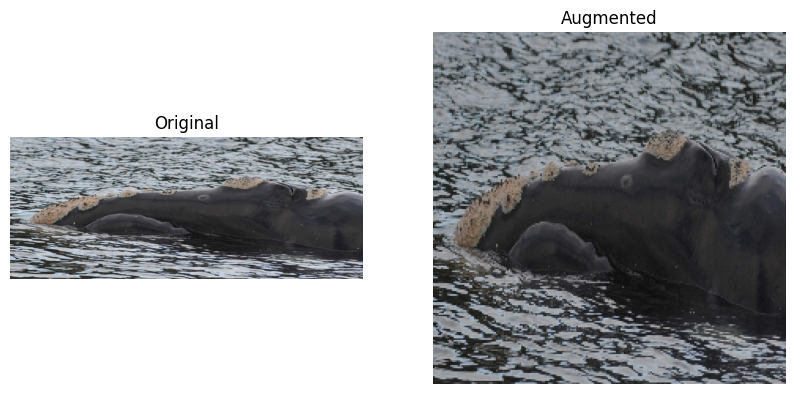

...

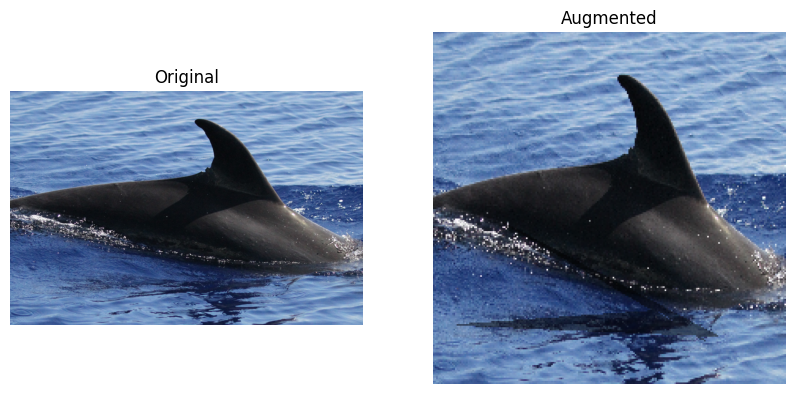

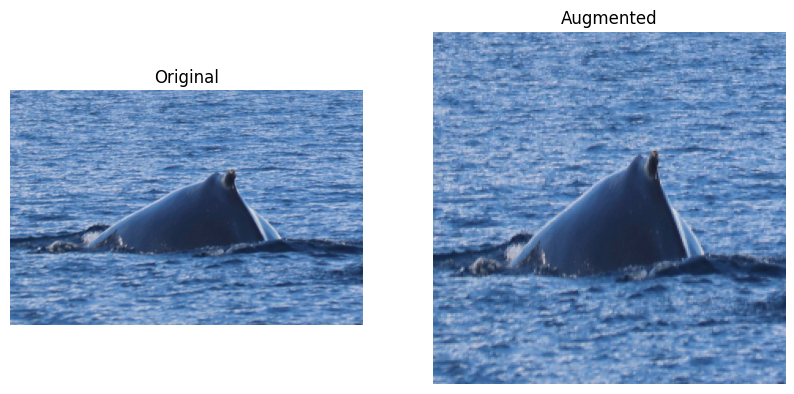

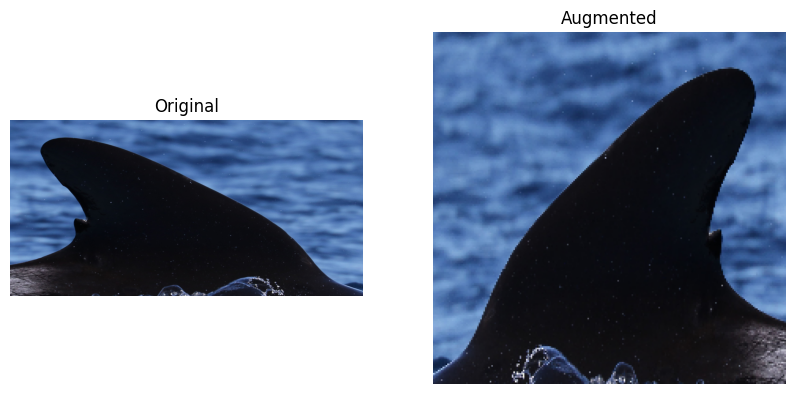

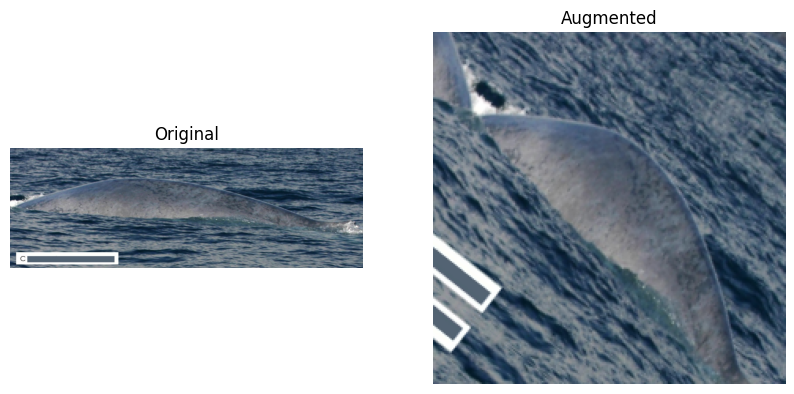

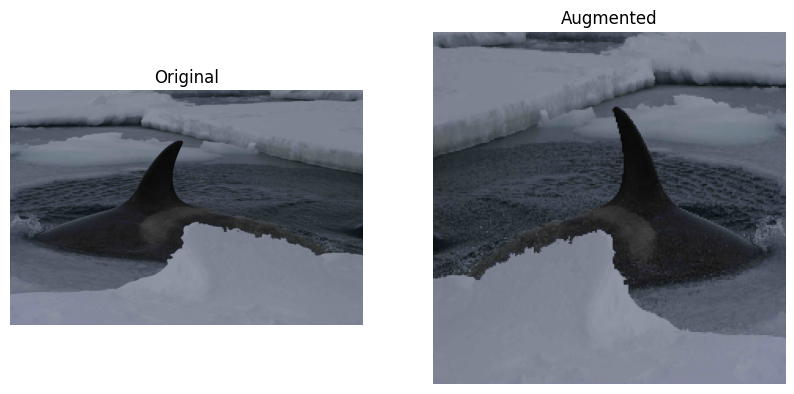

In [8]:

# Получаем аугментации
data_transforms = augmentation_data_transforms()

# Применяем аугментации к изображениям и показываем
process_images_with_augmentation(data_dir, data_transforms["train"])
